# Transfer learning and fine tuning with MobileNet_V2 and Xception with the addition of twice as many augmented instances of positive class.

MobileNet, Xception. Parameters selection, errors visualization

In [ ]:
import os
import gdown
# import shutil
import numpy as np
import pandas as pd
import pathlib
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Model
from tensorflow.keras.utils import save_img, img_to_array, array_to_img, load_img, image_dataset_from_directory
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
# from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import plot_model
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [ ]:
def show_dirs_len(path):
  for root, dirs, _ in os.walk(path):
    print(f"{os.path.relpath(root, path)}: {len(os.listdir(root))}")

## Формування робочого датасету

Завантаження джерела

In [ ]:
# https://drive.google.com/file/d/1kkJoL40OW9PfgEMtFkmyHAJWN7BVs_ee/view?usp=sharing
file_id = "1kkJoL40OW9PfgEMtFkmyHAJWN7BVs_ee"
url = f"https://drive.google.com/uc?id={file_id}"
output = "2020_supplemented.zip"

gdown.download(url, output, quiet=False)


Downloading...
From (original): https://drive.google.com/uc?id=1kkJoL40OW9PfgEMtFkmyHAJWN7BVs_ee
From (redirected): https://drive.google.com/uc?id=1kkJoL40OW9PfgEMtFkmyHAJWN7BVs_ee&confirm=t&uuid=e106f421-bff0-4ca5-964d-737b0bc3ba2b
To: /content/2020_supplemented.zip
100%|██████████| 1.59G/1.59G [00:22<00:00, 69.7MB/s]


'2020_supplemented.zip'

In [ ]:
!unzip -q 2020_supplemented.zip

In [ ]:
data_dir = pathlib.Path("/content/2020_supplemented")

In [ ]:
show_dirs_len(data_dir)

.: 2
train: 2
train/melanoma: 5093
train/other: 32112
test: 2
test/melanoma: 1587
test/other: 10638


In [ ]:
# shutil.rmtree("/content/2020_supplemented")

Функції для виділення з тренувального набору валідаційного, створення вибірки датасету потрібного розміру.

In [ ]:
def make_sructured_subset(rate, source_path, dest_path, my_seed, copy=True):

  """create folder the same structure as source
     with of content files"""
  np.random.seed(my_seed)
  for root, dirs, files in os.walk(source_path):
    relative_path = os.path.relpath(root, source_path)
    new_folder = os.path.join(dest_path, relative_path)
    os.makedirs(new_folder, exist_ok=True)
    if files:
      num_files = int(len(files)*rate)
      files_to_copy = np.random.choice(files, num_files, replace=False)

      for filename in files_to_copy:
        src_file = os.path.join(root, filename)
        dest_file = os.path.join(new_folder, filename)
        if copy:
          shutil.copyfile(src_file, dest_file)
        else:
          shutil.move(src_file, dest_file)

In [ ]:
def make_balanced_sructured_subset(source_path, dest_path, my_seed, rates_per_class, copy=True):

  """create folder the same structure as source
     with part of content files, picked using different rate for selected folder:
      rate*k"""
  np.random.seed(my_seed)
  for root, dirs, files in os.walk(source_path):
    relative_path = os.path.relpath(root, source_path)
    class_name = os.path.basename(relative_path)
    if class_name in rates_per_class:
       rate = rates_per_class[class_name]
    else:
      rate = 0.2
    new_folder = os.path.join(dest_path, relative_path)
    os.makedirs(new_folder, exist_ok=True)
    if files:
      num_files = int(len(files)*rate)
      files_to_copy = np.random.choice(files, num_files, replace=False)

      for filename in files_to_copy:
        src_file = os.path.join(root, filename)
        dest_file = os.path.join(new_folder, filename)
        if copy:
          shutil.copyfile(src_file, dest_file)
        else:
          shutil.move(src_file, dest_file)

In [ ]:
def make_custom_sructured_subset(source_path, dest_path, my_seed, rates_per_ds, copy=True):

  """create folder the same structure as source
     with % of source folder files, randomly picked
     using different rate for each ds"""
  np.random.seed(my_seed)
  for root, dirs, files in os.walk(source_path):
    relative_path = os.path.relpath(root, source_path)
    new_folder = os.path.join(dest_path, relative_path)
    os.makedirs(new_folder, exist_ok=True)
    if files:
      for ds in rates_per_ds.keys():
        if ds in new_folder.split(os.sep):
          rate = rates_per_ds[ds]
          break
      num_files = int(len(files)*rate)
      files_to_copy = np.random.choice(files, num_files, replace=False)

      for filename in files_to_copy:
        src_file = os.path.join(root, filename)
        dest_file = os.path.join(new_folder, filename)
        if copy:
          shutil.copyfile(src_file, dest_file)
        else:
          shutil.move(src_file, dest_file)

In [ ]:
# select in validation directory equal size of classes
val_dir = data_dir / "validation"
train_dir = data_dir / "train"
num_melanoma = len(os.listdir(os.path.join(train_dir, "melanoma")))
num_other = len(os.listdir(os.path.join(train_dir, "other")))
k = num_melanoma/num_other if num_other > 0 else 1
print(k)
rates_per_class = {
    "melanoma": 0.2,
    "other": 0.2*k
}
make_balanced_sructured_subset(train_dir, val_dir, 10, rates_per_class, copy=False)

0.15860114598903838


In [ ]:
show_dirs_len(data_dir)

.: 3
train: 2
train/melanoma: 4075
train/other: 31094
test: 2
test/melanoma: 1587
test/other: 10638
validation: 2
validation/melanoma: 1018
validation/other: 1018


In [ ]:
# select different proportion for train, valid and test datasets in small subset
subset_path = pathlib.Path("/content/small_subset")
rates_per_ds = {
    "train": 0.3,
    "validation": 1.0,
    "test": 0.7,
}
make_custom_sructured_subset(data_dir, subset_path, 10, rates_per_ds)

In [ ]:
show_dirs_len(subset_path)

.: 3
train: 2
train/melanoma: 1222
train/other: 9328
test: 2
test/melanoma: 1110
test/other: 7446
validation: 2
validation/melanoma: 1018
validation/other: 1018


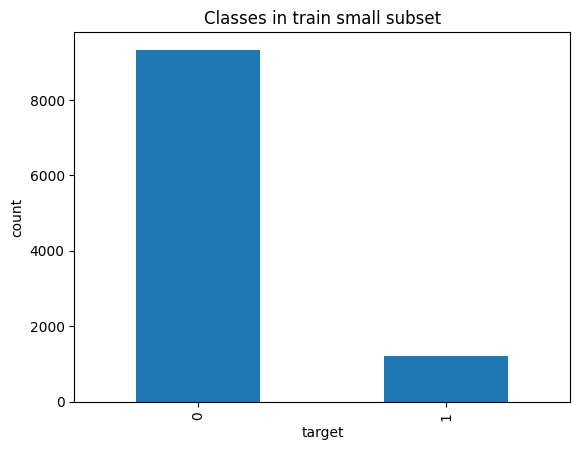

In [ ]:
tmp_df1 = pd.DataFrame({"image_name": os.listdir(subset_path / "train/melanoma"), "target": 1})
tmp_df2 = pd.DataFrame({"image_name": os.listdir(subset_path / "train/other"), "target": 0})
tmp_df_comb = pd.concat([tmp_df1, tmp_df2], ignore_index=True)
tmp_df_comb.target.value_counts().plot(kind='bar')
plt.title('Classes in train small subset')
plt.xlabel('target')
plt.ylabel('count')
plt.show()

## Аугментація цільового класу для збалансування набору

In [ ]:
data_augmentation = keras.Sequential(
    [ layers.RandomFlip(mode="horizontal_and_vertical"),
      layers.RandomRotation(0.5),
      layers.RandomZoom(0.3),
      layers.RandomShear(x_factor=0.2, y_factor=0.2, fill_mode="nearest"),
      # layers.MixUp(alpha=0.2),
      layers.RandomColorJitter(
          value_range=(0, 255),
          brightness_factor=0.1,
          contrast_factor=0.1,
          saturation_factor=(0.46, 0.54),
          hue_factor=0.05)
    ]
)

In [ ]:
def augment_and_save(img_path, data_augmentation, num_aug, save=True, output_dir=None):
  aug_images_set =[]
  img = load_img(img_path)
  img_arr = img_to_array(img)
  img_arr = np.expand_dims(img_arr, axis=0)  # додати розмірність - batch
  for i in range(num_aug):
    augmented_img_arr = data_augmentation(img_arr, training=True)
    # augmented_img = keras.utils.array_to_img(augmented_img_arr[0])
    augmented_img = array_to_img(augmented_img_arr[0])   #first in batch
    aug_images_set.append(augmented_img)
    if save:
      os.makedirs(output_dir, exist_ok=True)
      img_name = os.path.basename(img_path)
      output_path = os.path.join(output_dir, f"{os.path.splitext(img_name)[0]}_aug_{i}.jpg")
      save_img(output_path, augmented_img)
  return aug_images_set

def run_augmentation(data_augmentation, input_dir, output_dir, num_aug):
  for img_name in os.listdir(input_dir):
    if img_name.endswith((".png", ".jpg", ".jpeg")):
      img_path = os.path.join(input_dir, img_name)
      augment_and_save(img_path, data_augmentation, num_aug, save=True, output_dir=output_dir)

def run_selective_augmentation(data_augmentation, input_dir, output_dir, num_aug, ratio=0.3, my_seed=42):
  """augmentation of subset"""
  np.random.seed(my_seed)
  images = os.listdir(input_dir)
  images_to_augm = np.random.choice(images, int(len(images)*ratio), replace=False)
  for img_name in images_to_augm:
    if img_name.endswith((".png", ".jpg", ".jpeg")):
      img_path = os.path.join(input_dir, img_name)
      augment_and_save(img_path, data_augmentation, num_aug, save=True, output_dir=output_dir)

In [ ]:
input_dir = pathlib.Path("/content/small_subset/train/melanoma")
output_dir = pathlib.Path("/content/augmented")

Аугментація зображень з тренувального набору для класу "меланома".

In [ ]:
np.random.seed(42)
augm_example = np.random.choice(os.listdir(input_dir), 1)[0]
augm_example_path = os.path.join(input_dir, augm_example)
augm_example_set = augment_and_save(augm_example_path, data_augmentation, 5, save=False)
augm_example_set = [Image.open(augm_example_path)] + augm_example_set

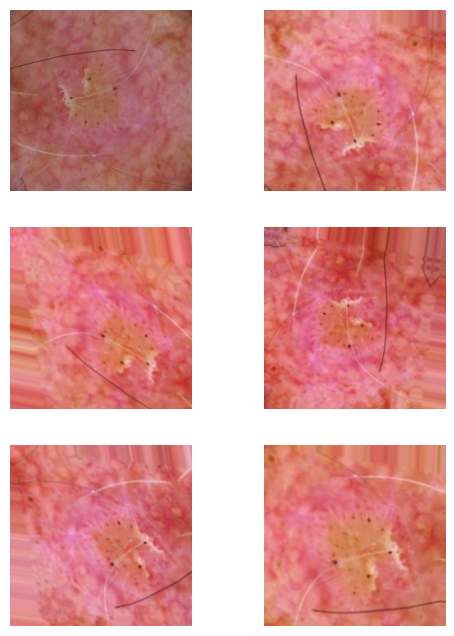

In [ ]:
plt.figure(figsize=(6, 8))
for i, image in enumerate(augm_example_set):
  ax = plt.subplot(3, 2, i + 1)
  plt.imshow(img_to_array(image).astype("uint8"))
  plt.axis("off")

In [ ]:
run_augmentation(data_augmentation, input_dir, output_dir, 4)

In [ ]:
show_dirs_len(output_dir)

.: 4888


In [ ]:
# зберегти за потреби аугментовані зображення
!zip -q -r 2020_train_melanoma_augmented_sub_2.zip . -i /augmented/*
from google.colab import files
files.download("2020_train_melanoma_augmented_sub_2.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# зберегти підвибірку без аугментації
!zip -q -r small_subset.zip content/small_subset/
from google.colab import files
files.download("small_subset.zip")


zip error: Nothing to do! (try: zip -q -r 2020_small_subset.zip . -i ./content/small_subset/)


In [ ]:
def add_files(source_dir, dest_dir):
  os.makedirs(dest_dir, exist_ok=True)
  for file_name in os.listdir(source_dir):
    source_file = os.path.join(source_dir, file_name)
    if os.path.isfile(source_file):
      destination_file = os.path.join(dest_dir, file_name)
      shutil.copyfile(source_file, destination_file)

In [ ]:
# додати аугментовані файли у вибірку
add_files(output_dir, input_dir)

In [ ]:
show_dirs_len(input_dir)

.: 6110


In [ ]:
show_dirs_len(subset_path)

.: 3
train: 2
train/melanoma: 6110
train/other: 9328
test: 2
test/melanoma: 1110
test/other: 7446
validation: 2
validation/melanoma: 1018
validation/other: 1018


In [ ]:
# зберегти вибірку з аугментацією цільового класу
# !zip -q -r small_subset_with_augm.zip /content/small_subset
# from google.colab import files
# files.download("small_subset_with_augm.zip")

In [ ]:
# зберегти вибірку з аугментацією цільового класу
!zip -q -r small_subset_with_augm4.zip /content/small_subset
from google.colab import files
files.download("small_subset_with_augm4.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

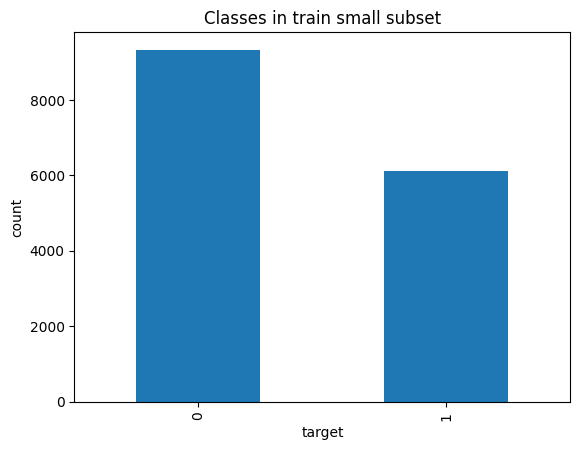

In [ ]:
tmp_df1 = pd.DataFrame({"image_name": os.listdir(subset_path / "train/melanoma"), "target": 1})
tmp_df2 = pd.DataFrame({"image_name": os.listdir(subset_path / "train/other"), "target": 0})
tmp_df_comb = pd.concat([tmp_df1, tmp_df2], ignore_index=True)
tmp_df_comb.target.value_counts().plot(kind='bar')
plt.title('Classes in train small subset')
plt.xlabel('target')
plt.ylabel('count')
plt.show()

## Завантаження даних для навчання

In [ ]:
# датасет з аугментацією 1:2
# https://drive.google.com/file/d/1a_KlWRSt82bZDcJDQa18Mf7zwTNNFx6-/view?usp=sharing
file_id = "1a_KlWRSt82bZDcJDQa18Mf7zwTNNFx6-"
url = f"https://drive.google.com/uc?id={file_id}"
output = "small_subset_with_augm.zip"

gdown.download(url, output, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1a_KlWRSt82bZDcJDQa18Mf7zwTNNFx6-
From (redirected): https://drive.google.com/uc?id=1a_KlWRSt82bZDcJDQa18Mf7zwTNNFx6-&confirm=t&uuid=42bce34e-4480-4aed-b98f-851b0b386ba1
To: /content/small_subset_with_augm.zip
100%|██████████| 878M/878M [00:12<00:00, 68.2MB/s]


'small_subset_with_augm.zip'

In [ ]:
!unzip -q small_subset_with_augm.zip

In [ ]:
# датасет з аугментацією 1:4
# https://drive.google.com/file/d/1xQm9-q9_e1vNrSZTPBqqSU4MGY5mv3R9/view?usp=sharing
file_id = "1xQm9-q9_e1vNrSZTPBqqSU4MGY5mv3R9"
url = f"https://drive.google.com/uc?id={file_id}"
output = "small_subset_with_augm4.zip"

gdown.download(url, output, quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1xQm9-q9_e1vNrSZTPBqqSU4MGY5mv3R9
From (redirected): https://drive.google.com/uc?id=1xQm9-q9_e1vNrSZTPBqqSU4MGY5mv3R9&confirm=t&uuid=df58cfd4-9a22-4847-8f76-f99b8f472eaf
To: /content/small_subset_with_augm4.zip
100%|██████████| 899M/899M [00:17<00:00, 52.6MB/s]


'small_subset_with_augm4.zip'

In [ ]:
!unzip -q small_subset_with_augm4.zip

In [ ]:
# small_data_dir = "/content/content/small_subset"
show_dirs_len(small_data_dir)

.: 3
test: 2
test/melanoma: 1110
test/other: 7446
train: 2
train/melanoma: 6110
train/other: 9328
validation: 2
validation/melanoma: 1018
validation/other: 1018


## Підготовка до навчання

### Визначення параметрів, функцій для побудови моделі

In [ ]:
def generate_model_version_name():

  from datetime import datetime

  now = datetime.now()
  month_day = now.strftime("%m-%d")  # Формат: ММ-ДД
  hours = now.strftime("%H")  # Формат: ЧЧ, тільки години
  return month_day + "-" + hours

In [ ]:
# при дисбалансі класів
def binary_class_weights(dataset):
  count_1 = 0
  count_0 = 0
  for items, labels in dataset:
    labels = labels.numpy()
    count_1 += np.sum(labels==1)
    count_0 += np.sum(labels==0)
  weight_1 = (1/count_1) * ((count_1+count_0)/2.0)
  weight_0 = (1/count_0) * ((count_1+count_0)/2.0)
  return (weight_0, weight_1)

def initial_bias_calc(dataset):
  count_1 = 0
  count_0 = 0
  for items, labels in dataset:
    labels = labels.numpy()
    count_1 += np.sum(labels==1)
    count_0 += np.sum(labels==0)
  weight_1 = (1/count_1) * ((count_1+count_0)/2.0)
  weight_0 = (1/count_0) * ((count_1+count_0)/2.0)
  return np.log([count_1/count_0])


In [ ]:
# при дисбалансі класів при відомій кількості екземплярів кожного класу
def binary_class_weights_2(count_1, count_0):
  weight_1 = (1/count_1) * ((count_1+count_0)/2.0)
  weight_0 = (1/count_0) * ((count_1+count_0)/2.0)
  return (weight_0, weight_1)

def initial_bias_calc_2(count_1, count_0):
  weight_1 = (1/count_1) * ((count_1+count_0)/2.0)
  weight_0 = (1/count_0) * ((count_1+count_0)/2.0)
  return np.log(count_1/count_0)

In [ ]:
# логування
import csv
from tensorflow.keras.callbacks import Callback

# зібрати під час навчання метрики
class MetricsLogger(Callback):
    def __init__(self, filepath):
        super().__init__()
        self.filepath = filepath
        self.metrics = None
        # create file on init
        with open(self.filepath, mode='w', newline='') as f:
            writer = csv.writer(f)
            writer.writerow(['epoch'])
    # method Callbak class
    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        # get logs keys
        if self.metrics is None:
          self.metrics = list(logs.keys())
            # add metrics header to csv
          with open(self.filepath, mode='a', newline='') as f:
              writer = csv.writer(f)
              writer.writerow(['epoch'] + self.metrics)
        with open(self.filepath, mode='a', newline='') as f:
            writer = csv.writer(f)
            writer.writerow([epoch] + [logs[m] for m in self.metrics])

In [ ]:
# візуалізація
def plot_scores (df, model_name, metrics_list):
  n = len(metrics_list)
  fig = plt.figure(figsize=(16, int(np.ceil(n/3)*4) ))
  fig.suptitle(f'{model_name}')
  for i, metric in enumerate(metrics_list):
    ax = plt.subplot(int(np.ceil(n/3)), 3, i + 1)
    ax.plot(df.index+1, df[metric], label=metric)
    ax.plot(df.index+1, df["val_" + metric], label="val_" + metric)
    ax.legend(loc='lower right')
    ax.grid(True)
  fig2 = plt.figure(figsize=(8, 6))
  for i, metric in enumerate(metrics_list):
    plt.plot(df.index+1, df[metric], label=metric)
    plt.plot(df.index+1, df["val_" + metric], label="val_" + metric)
  plt.legend(loc='lower right')
  plt.show();

def plot_loss(df, model_name):
  fig = plt.figure(figsize=(8, 6))
  fig.suptitle(f'{model_name + " loss"}')
  plt.plot(df.index+1, df['loss'], label='train loss')
  plt.plot(df.index+1, df["val_loss"], label="validation loss")
  plt.legend(loc='lower right')
  plt.grid(True)
  plt.show();

In [ ]:
def plot_confusion_matrix(labels, predictions, threshold=0.5):
  cm = confusion_matrix(labels, predictions > threshold)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["other", "melanoma"])
  disp.plot(cmap=plt.cm.Blues)
  plt.xlabel("Predictions")
  plt.ylabel("Actual")
  plt.title('Confusion matrix')
  plt.show()

In [ ]:
def fbeta_metric(precision, recall, beta=2.0):
  return precision * recall * (1+beta**2)/( (beta**2) * precision + recall)

In [ ]:
# IM_SIZE = 256
BATCH_SIZE = 32
METRICS = [
      keras.metrics.BinaryAccuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      keras.metrics.TruePositives(name='tp'),
      keras.metrics.FalsePositives(name='fp'),
      keras.metrics.TrueNegatives(name='tn'),
      keras.metrics.FalseNegatives(name='fn'),
      keras.metrics.AUC(name='auc'),
      keras.metrics.AUC(name='prc', curve='PR') # precision-recall curve
]
VERSION = generate_model_version_name()
# MODEL_NAME = f"Basic_model_{VERSION}"
LEARNING_RATE = 1e-4

In [ ]:
VERSION

'03-29-11'

### Сворення об'єктів tf.Dataset

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  small_data_dir / "train",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  shuffle=True,
  batch_size=BATCH_SIZE)

val_ds = tf.keras.utils.image_dataset_from_directory(
  small_data_dir / "validation",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

test_ds = tf.keras.utils.image_dataset_from_directory(
  small_data_dir / "test",
  class_names=["other", "melanoma"],
  seed=123,
  # image_size=(IM_SIZE, IM_SIZE),
  batch_size=BATCH_SIZE)

Found 15438 files belonging to 2 classes.
Found 2036 files belonging to 2 classes.
Found 8556 files belonging to 2 classes.


### Візуалізація датасету

In [ ]:
class_names = train_ds.class_names
print(class_names)

In [ ]:
print(train_ds)
print(val_ds)
print(test_ds)

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

### передобробка датасету

In [ ]:
# Configure the dataset for performance
train_ds = train_ds.shuffle(64).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=tf.data.AUTOTUNE)

### ваги класів та initial bias при дисбалансі класів

In [ ]:
count_1 = len(os.listdir(small_data_dir / "train/melanoma"))
count_0 = len(os.listdir(small_data_dir / "train/other"))

In [ ]:
# weight_0, weight_1 = binary_class_weights(train_ds)
weight_0, weight_1 = binary_class_weights_2(count_1, count_0)

class_weights = {0: weight_0, 1: weight_1}

print(f'Weight for class 0: {weight_0:.2f}')
print(f'Weight for class 1: {weight_1:.2f}')

Weight for class 0: 0.83
Weight for class 1: 1.26


In [ ]:
# initial_bias = initial_bias_calc(train_ds)
initial_bias = initial_bias_calc_2(count_1, count_0)
print(f'initial_bias: {initial_bias}')

initial_bias: -0.4230938564246326


### Модель

In [ ]:
# створення та компіляція моделі з заданим bias для останнього шару
def make_model(learning_rate=1e-3, metrics=METRICS, model=None, output_bias=None):
  model.compile(
      optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
      loss=keras.losses.BinaryCrossentropy(),
      metrics=metrics)
  if output_bias is not None:
    model.layers[-1].bias.assign([output_bias])
  return model

In [ ]:
MODEL_NAMES = [f"MobileNetV2_{VERSION}",
              f"Xception_{VERSION}",
              f"ResNet50V2_{VERSION}",
              f"InceptionV3_{VERSION}",
               f"ConvNeXtTiny_{VERSION}",
               f"DenseNet121_{VERSION}",
               f"NASNetMobile_{VERSION}",
               f"EfficientNetV2B0_{VERSION}"]

In [ ]:
# ! Перезапускати
model_index = 1
MODEL_NAME = MODEL_NAMES[model_index]

In [ ]:
MODEL_NAME

'Xception_03-29-11'

In [ ]:
if model_index == 0:
  from keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input
  IM_SIZE = 256       #224
  base_model = MobileNetV2(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 1:
  from keras.applications.xception import Xception, preprocess_input
  IM_SIZE = 256   #229
  base_model = Xception(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 2:
  from keras.applications.resnet_v2 import ResNet50V2, preprocess_input
  IM_SIZE = 256   #224
  base_model = ResNet50V2(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 3:
  from keras.applications.inception_v3 import InceptionV3, preprocess_input
  IM_SIZE = 256   #229
  base_model = InceptionV3(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 4:
  from keras.applications.convnext import ConvNeXtTiny, preprocess_input
  IM_SIZE = 256
  base_model = ConvNeXtTiny(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 5:
  from keras.applications.densenet import DenseNet121, preprocess_input
  IM_SIZE = 256   #224
  base_model = DenseNet121(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 6:
  from keras.applications.nasnet import NASNetMobile, preprocess_input
  IM_SIZE = 256    #224
  base_model = NASNetMobile(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

if model_index == 7:
  from keras.applications.efficientnet_v2 import EfficientNetV2B0, preprocess_input
  IM_SIZE = 256
  base_model = EfficientNetV2B0(
    weights="imagenet",
    input_shape=(IM_SIZE, IM_SIZE, 3),
    include_top=False)

print(base_model.output_shape)

# preprocess for fine_tuning:
def preprocess(image, label):
  image = preprocess_input(image)
  return image, label

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
(None, 8, 8, 2048)


In [ ]:
# заморозити шари базової моделі
base_model.trainable = False

In [ ]:
# модель
inputs = keras.Input(shape=(IM_SIZE, IM_SIZE, 3))
preprocessed = layers.Lambda(preprocess_input)(inputs)
x = base_model(preprocessed, training=False)  #to keep batchnorm layers in inference mode, when unfreeze the base model for fine-tuning
x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Dropout(0.5)(x)
x = keras.layers.Dense(128, activation='relu', name="full_con1")(x)
outputs = keras.layers.Dense(1, activation='sigmoid', name="pred")(x)
model = keras.Model(inputs, outputs)

# Навчання та оцінка

### MobileNetV2

### Feature extraction

In [ ]:
labels = ['tl-', 'ft-']
label = labels[0]

In [ ]:
MODEL_NAME

'MobileNetV2_03-27-19'

In [ ]:
# створення та компіляція transfer learning моделі
ft_model = make_model(metrics=METRICS, model=model, output_bias=initial_bias)
model.summary(show_trainable=True)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)                        ┃ Output Shape                 ┃       Param # ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer_1 (InputLayer)          │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ lambda (Lambda)                     │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ mobilenetv2_1.00_224 (Functional)   │ (None, 8, 8, 1280)           │     2,257,984 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ global_average_pooling2d            │ (None, 1280)                 │             0 │    -    │
│ (GlobalAveragePooling2D)            │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ dropout (Dropout)                   │ (None, 1280)                 │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ full_con1 (Dense)                   │ (None, 128)                  │       163,968 │    Y    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ pred (Dense)                        │ (None, 1)                    │           129 │    Y    │
└─────────────────────────────────────┴──────────────────────────────┴───────────────┴─────────┘

 Total params: 2,422,081 (9.24 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# створити логгер
metrics_logger = MetricsLogger(filepath=f"metrics_logs_{label}{MODEL_NAME}.csv")

In [ ]:
callbacks_list = [EarlyStopping(monitor='val_accuracy', patience=6),
                  ModelCheckpoint(f'small-{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"small-{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=20

In [ ]:
# MobileNetV2
history = ft_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)

Epoch 1/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - accuracy: 0.9186 - auc: 0.9658 - fn: 271.7748 - fp: 293.5723 - loss: 0.2209 - prc: 0.9577 - precision: 0.8911 - recall: 0.9027 - tn: 4391.7729 - tp: 2801.9587 - val_accuracy: 0.8615 - val_auc: 0.9450 - val_fn: 215.0000 - val_fp: 67.0000 - val_loss: 0.3121 - val_prc: 0.9517 - val_precision: 0.9230 - val_recall: 0.7888 - val_tn: 951.0000 - val_tp: 803.0000
Epoch 2/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 19s 37ms/step - accuracy: 0.9450 - auc: 0.9838 - fn: 235.6839 - fp: 196.6364 - loss: 0.1529 - prc: 0.9808 - precision: 0.9358 - recall: 0.9230 - tn: 4496.7500 - tp: 2829.7480 - val_accuracy: 0.8286 - val_auc: 0.9486 - val_fn: 322.0000 - val_fp: 27.0000 - val_loss: 0.3772 - val_prc: 0.9536 - val_precision: 0.9627 - val_recall: 0.6837 - val_tn: 991.0000 - val_tp: 696.0000
Epoch 3/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - accuracy: 0.9534 - auc: 0.9864 - fn: 206.0207 - fp: 162.0455 - loss: 0.1366 - prc: 0.9843 - precision: 0.9483 - recall

In [ ]:
from google.colab import files

df_basic = pd.DataFrame(history.history)
df_basic.to_csv(f"metrics_{label}{MODEL_NAME}.csv", index=False)

files.download(f'/content/metrics_logs_{label}{MODEL_NAME}.csv')
files.download(f'/content/small-{label}{MODEL_NAME}.keras')
files.download(f'/content/metrics_{label}{MODEL_NAME}.csv')

# metrics_filepath = f"/content/metrics_{label}{MODEL_NAME}.csv"
# df_basic = pd.read_csv(metrics_filepath)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

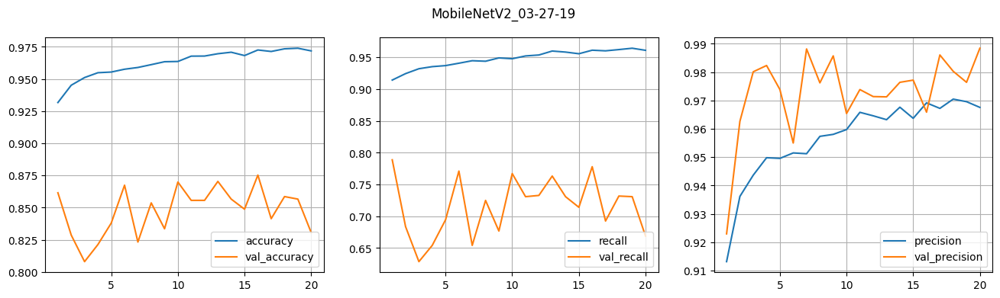

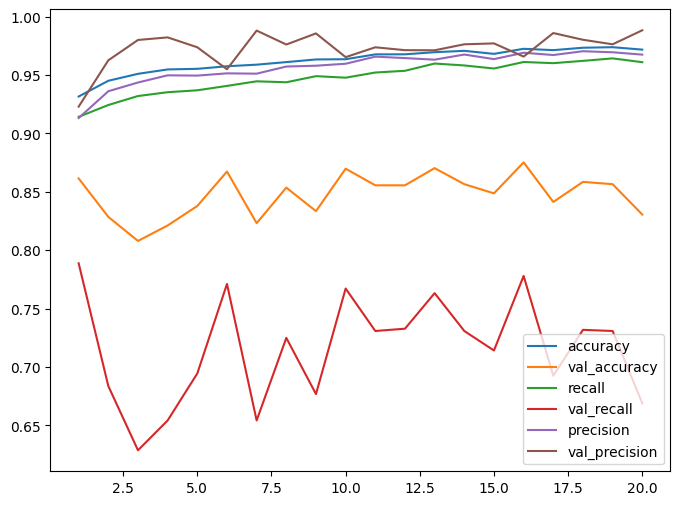

In [ ]:
# MobileNetV2
plot_scores (df_basic, MODEL_NAME, ['accuracy', 'recall', 'precision'])

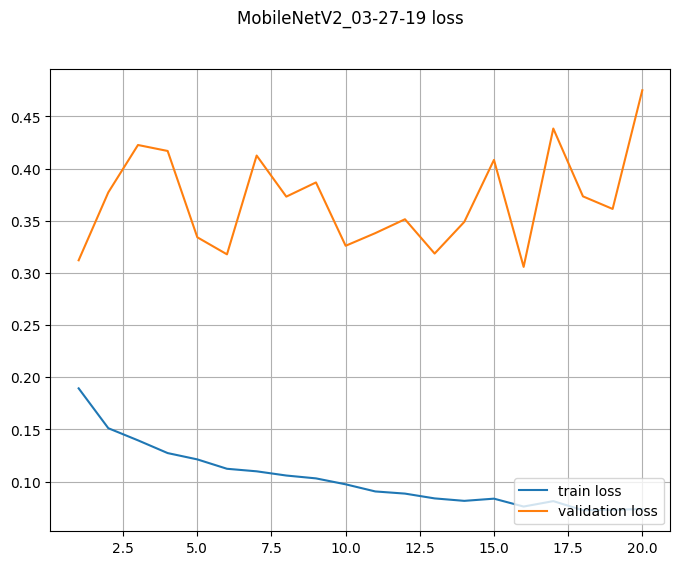

In [ ]:
# MobileNetV2
plot_loss(df_basic, MODEL_NAME)

In [ ]:

model_path = f"/content/small-{label}{MODEL_NAME}.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

In [ ]:
best_tl_results = best_tl_model.evaluate(test_ds, verbose=1)

268/268 ━━━━━━━━━━━━━━━━━━━━ 16s 46ms/step - accuracy: 0.9358 - auc: 0.9389 - fn: 139.9777 - fp: 133.6320 - loss: 0.1851 - prc: 0.8311 - precision: 0.7448 - recall: 0.7461 - tn: 3634.6616 - tp: 411.4610


In [ ]:
for name, value in zip(best_tl_model.metrics_names, best_tl_results):
  print(name, ': ', value)
print()

loss :  0.17646639049053192
compile_metrics :  0.9379382729530334



In [ ]:
precision = best_tl_results[2]
recall = best_tl_results[3]
fbeta = fbeta_metric(precision, recall)
best_tl_results.append(fbeta)

In [ ]:
for name, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_tl_results):
  print(name, ': ', value)
print()

loss :  0.17646639049053192
accuracy :  0.9379382729530334
precision :  0.7629427909851074
recall :  0.7567567825317383
tp :  840.0
fp :  261.0
tn :  7185.0
fn :  270.0
auc :  0.9430896639823914
prc :  0.8495543599128723
f1_beta :  0.7925154454646981



In [ ]:
# Зберегти результат оцінки на тествому наборі
df_eval = pd.DataFrame({'Metric': ["loss"] + METRICS + ["f1_beta"], 'Value': best_tl_results})
df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Fine tuning

In [ ]:
MODEL_NAME

'MobileNetV2_03-27-10'

In [ ]:
labels = ['tl-', 'ft-']
label = labels[1]

In [ ]:
from google.colab import files
files.upload()

In [ ]:
model_path = f"/content/small-tl-{MODEL_NAME}.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

In [ ]:
base_model = best_tl_model.get_layer('mobilenetv2_1.00_224')

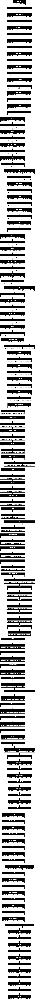

In [ ]:
plot_model(base_model, show_shapes=True)

In [ ]:
for layer in base_model.layers[-20:]:
  layer.trainable=True

for layer in base_model.layers[:-20]:
  layer.trainable=False

In [ ]:
best_tl_model.summary(show_trainable=True)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)                        ┃ Output Shape                 ┃       Param # ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer_1 (InputLayer)          │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ lambda (Lambda)                     │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ mobilenetv2_1.00_224 (Functional)   │ (None, 8, 8, 1280)           │     2,257,984 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ global_average_pooling2d            │ (None, 1280)                 │             0 │    -    │
│ (GlobalAveragePooling2D)            │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ dropout (Dropout)                   │ (None, 1280)                 │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ full_con1 (Dense)                   │ (None, 128)                  │       163,968 │    Y    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ pred (Dense)                        │ (None, 1)                    │           129 │    Y    │
└─────────────────────────────────────┴──────────────────────────────┴───────────────┴─────────┘

 Total params: 2,750,277 (10.49 MB)

 Trainable params: 1,370,177 (5.23 MB)

 Non-trainable params: 1,051,904 (4.01 MB)

 Optimizer params: 328,196 (1.25 MB)

In [ ]:
# створити логгер
metrics_logger = MetricsLogger(filepath=f"metrics_logs_{label}{MODEL_NAME}.csv")

In [ ]:
best_tl_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss=keras.losses.BinaryCrossentropy(),
    metrics=METRICS)

In [ ]:
callbacks_list = [EarlyStopping(monitor='val_accuracy', patience=6),
                  ModelCheckpoint(f'small-{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"small-{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=20

In [ ]:
# MobileNetV2 fine tuning
history = best_tl_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)

Epoch 1/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - accuracy: 0.8948 - auc: 0.9579 - fn: 615.8802 - fp: 327.6508 - loss: 0.2622 - prc: 0.9505 - precision: 0.9170 - recall: 0.8303 - tn: 5376.0474 - tp: 3476.1694 - val_accuracy: 0.8438 - val_auc: 0.9561 - val_fn: 310.0000 - val_fp: 8.0000 - val_loss: 0.4684 - val_prc: 0.9648 - val_precision: 0.9888 - val_recall: 0.6955 - val_tn: 1010.0000 - val_tp: 708.0000
Epoch 2/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - accuracy: 0.9425 - auc: 0.9832 - fn: 226.0723 - fp: 213.3306 - loss: 0.1718 - prc: 0.9774 - precision: 0.9298 - recall: 0.9241 - tn: 4475.4712 - tp: 2843.4980 - val_accuracy: 0.8590 - val_auc: 0.9565 - val_fn: 274.0000 - val_fp: 13.0000 - val_loss: 0.4336 - val_prc: 0.9635 - val_precision: 0.9828 - val_recall: 0.7308 - val_tn: 1005.0000 - val_tp: 744.0000
Epoch 3/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 22s 44ms/step - accuracy: 0.9573 - auc: 0.9891 - fn: 180.6612 - fp: 142.6818 - loss: 0.1242 - prc: 0.9852 - precision: 0.9525 - recal

In [ ]:
# from google.colab import files

df_basic = pd.DataFrame(history.history)
df_basic.to_csv(f"metrics_{label}{MODEL_NAME}.csv", index=False)

files.download(f'/content/metrics_logs_{label}{MODEL_NAME}.csv')
files.download(f'/content/small-{label}{MODEL_NAME}.keras')
files.download(f'/content/metrics_{label}{MODEL_NAME}.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

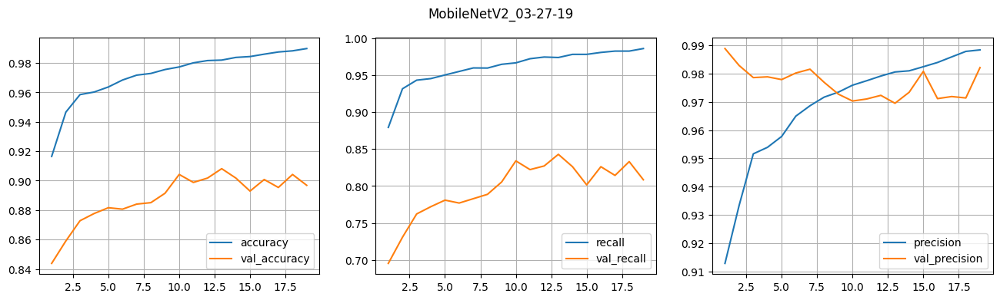

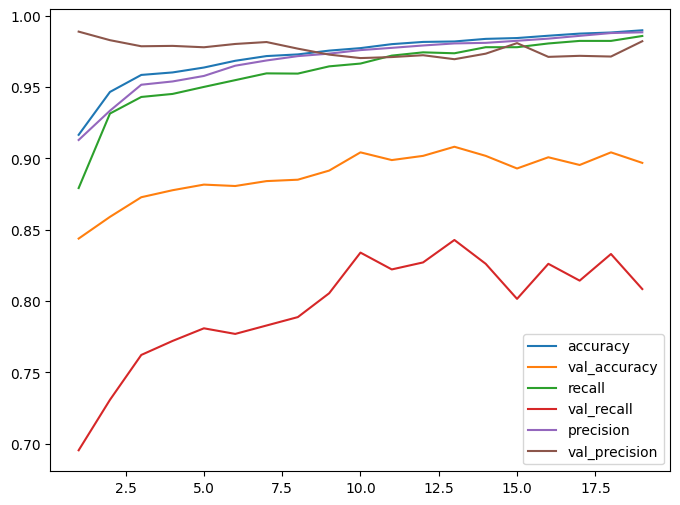

In [ ]:
plot_scores (df_basic, MODEL_NAME, ['accuracy', 'recall', 'precision'])

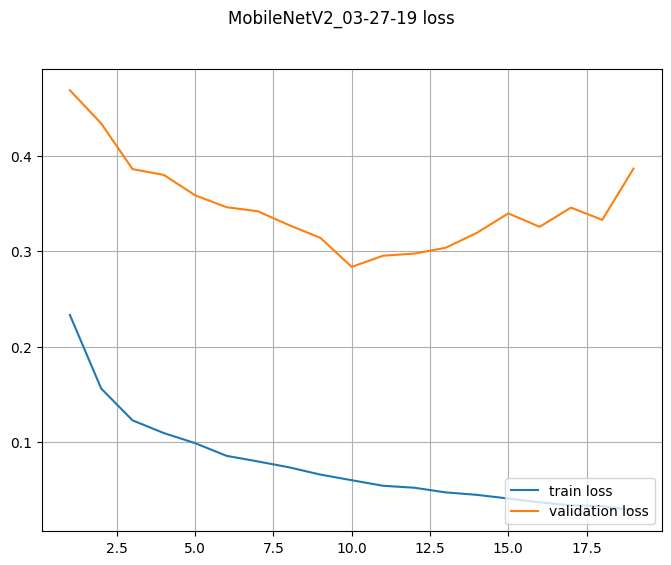

In [ ]:
plot_loss(df_basic, MODEL_NAME)

In [ ]:
# load best model after fine tuning
model_path = f"/content/small-ft-{MODEL_NAME}.keras"
# model_path = "small-ft-MobileNetV2_03-27-10.keras"
best_ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

In [ ]:
best_ft_results = best_ft_model.evaluate(test_ds, verbose=1)

268/268 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - accuracy: 0.9493 - auc: 0.9570 - fn: 99.6840 - fp: 114.7918 - loss: 0.1539 - prc: 0.8832 - precision: 0.7893 - recall: 0.8223 - tn: 3653.3159 - tp: 451.9405


In [ ]:
precision = best_ft_results[2]
recall = best_ft_results[3]
fbeta = fbeta_metric(precision, recall)
best_ft_results.append(fbeta)

In [ ]:
for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_ft_results):
  print(metric, ': ', value)
print()

loss :  0.15487436950206757
accuracy :  0.950560986995697
precision :  0.8026431798934937
recall :  0.8207207322120667
tp :  911.0
fp :  224.0
tn :  7222.0
fn :  199.0
auc :  0.9564327001571655
prc :  0.8854201436042786
f1_beta :  0.8284256183677543



In [ ]:
# Зберегти результат оцінки на тествому наборі
df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': best_ft_results})
df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
# best_ft_results = best_ft_model.evaluate(test_ds, verbose=1)

268/268 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9352 - auc: 0.9552 - fbeta: 0.8184 - fn: 82.0000 - fp: 208.8067 - loss: 0.1918 - prc: 0.8815 - precision: 0.7025 - recall: 0.8537 - tn: 3559.3010 - tp: 469.6245


In [ ]:
# for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_ft_results):
#   print(metric, ': ', value)
# print()

loss :  0.1917123645544052
accuracy :  0.9332631826400757
precision :  0.6980161666870117
recall :  0.8558558821678162
fbeta :  0.8188244104385376
tp :  950.0
fp :  411.0
tn :  7035.0
fn :  160.0
auc :  0.957641065120697
prc :  0.8782067894935608



In [ ]:
predictions_array = []
test_labels_array = []
for images, labels in test_ds:
    predictions = best_ft_model.predict(images, verbose=0)
    predictions_array.extend(predictions)
    test_labels_array.extend(labels.numpy())
predictions_array = np.array(predictions_array)
test_labels_array = np.array(test_labels_array)

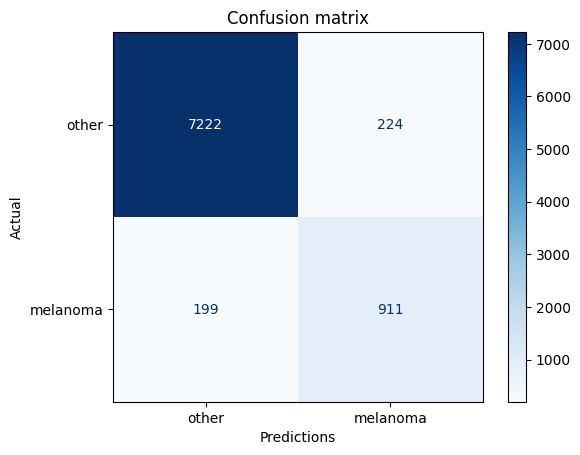

In [ ]:
plot_confusion_matrix(test_labels_array, predictions_array, threshold=0.5)

## Xception

In [ ]:
!rm -rf wandb/ ~/.wandb /tmp/wandb

### transfer learning Xception

! оновити визначення версії, моделі, індекс, базова модель, модель

In [ ]:
labels = ['tl-', 'ft-']
label = labels[0]

In [ ]:
# створення та компіляція transfer learning моделі
tl_model = make_model(metrics=METRICS, model=model, output_bias=initial_bias)
model.summary(show_trainable=True)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)                        ┃ Output Shape                 ┃       Param # ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer_1 (InputLayer)          │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ lambda (Lambda)                     │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ xception (Functional)               │ (None, 8, 8, 2048)           │    20,861,480 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ global_average_pooling2d            │ (None, 2048)                 │             0 │    -    │
│ (GlobalAveragePooling2D)            │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ dropout (Dropout)                   │ (None, 2048)                 │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ full_con1 (Dense)                   │ (None, 128)                  │       262,272 │    Y    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ pred (Dense)                        │ (None, 1)                    │           129 │    Y    │
└─────────────────────────────────────┴──────────────────────────────┴───────────────┴─────────┘

 Total params: 21,123,881 (80.58 MB)

 Trainable params: 262,401 (1.00 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

In [ ]:
# створити логгер
metrics_logger = MetricsLogger(filepath=f"metrics_logs_{label}{MODEL_NAME}.csv")

In [ ]:
callbacks_list = [EarlyStopping(monitor='val_accuracy', patience=6),
                  ModelCheckpoint(f'small-{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"small-{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=20

In [ ]:
# Xception
history = tl_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)

Epoch 1/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 109s 193ms/step - accuracy: 0.9063 - auc: 0.9594 - fn: 334.3264 - fp: 314.7211 - loss: 0.2418 - prc: 0.9514 - precision: 0.8847 - recall: 0.8738 - tn: 4373.5972 - tp: 2736.9172 - val_accuracy: 0.8168 - val_auc: 0.9459 - val_fn: 347.0000 - val_fp: 26.0000 - val_loss: 0.3992 - val_prc: 0.9501 - val_precision: 0.9627 - val_recall: 0.6591 - val_tn: 992.0000 - val_tp: 671.0000
Epoch 2/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 79s 161ms/step - accuracy: 0.9365 - auc: 0.9809 - fn: 261.2707 - fp: 226.7417 - loss: 0.1680 - prc: 0.9768 - precision: 0.9257 - recall: 0.9126 - tn: 4468.8408 - tp: 2800.6633 - val_accuracy: 0.8340 - val_auc: 0.9518 - val_fn: 322.0000 - val_fp: 16.0000 - val_loss: 0.3793 - val_prc: 0.9569 - val_precision: 0.9775 - val_recall: 0.6837 - val_tn: 1002.0000 - val_tp: 696.0000
Epoch 3/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 78s 161ms/step - accuracy: 0.9484 - auc: 0.9864 - fn: 225.9566 - fp: 196.4711 - loss: 0.1412 - prc: 0.9838 - precision: 0.9404 - r

In [ ]:
from google.colab import files

df_basic = pd.DataFrame(history.history)
df_basic.to_csv(f"metrics_{label}{MODEL_NAME}.csv", index=False)

files.download(f'/content/metrics_logs_{label}{MODEL_NAME}.csv')
files.download(f'/content/small-{label}{MODEL_NAME}.keras')
files.download(f'/content/metrics_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

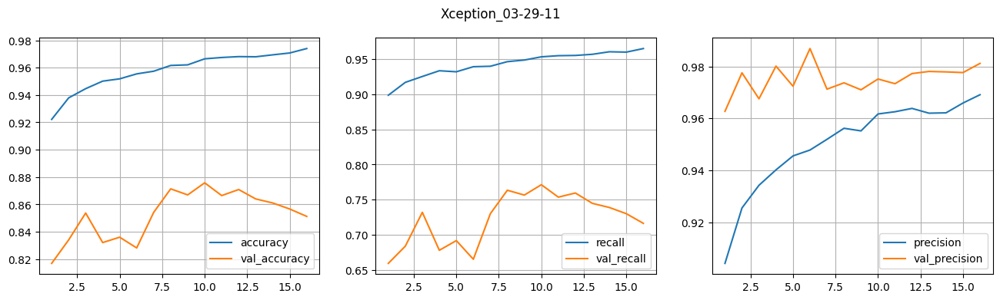

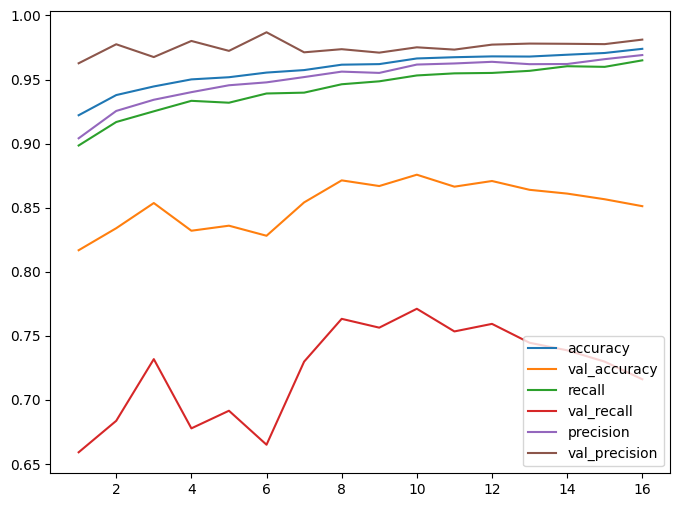

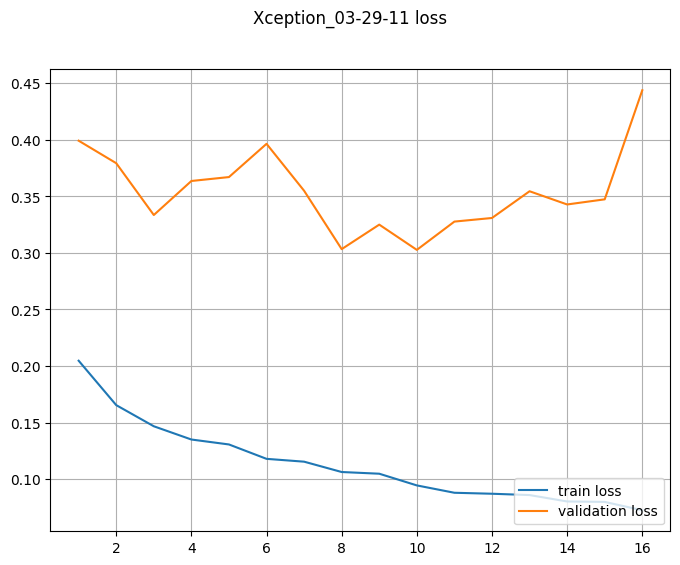

In [ ]:
plot_scores (df_basic, MODEL_NAME, ['accuracy', 'recall', 'precision'])
plot_loss(df_basic, MODEL_NAME)

In [ ]:
model_path = f"/content/small-tl-{MODEL_NAME}.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

In [ ]:
best_tl_results = best_tl_model.evaluate(test_ds, verbose=1)

268/268 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - accuracy: 0.9400 - auc: 0.9556 - fn: 125.9033 - fp: 121.0855 - loss: 0.1654 - prc: 0.8639 - precision: 0.7608 - recall: 0.7636 - tn: 3647.2083 - tp: 425.5353


In [ ]:
precision = best_tl_results[2]
recall = best_tl_results[3]
fbeta = fbeta_metric(precision, recall)
best_tl_results.append(fbeta)

In [ ]:
for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_tl_results):
  print(metric, ': ', value)
print()

loss :  0.15815481543540955
accuracy :  0.9448340535163879
precision :  0.7910584211349487
recall :  0.7810810804367065
tp :  867.0
fp :  229.0
tn :  7217.0
fn :  243.0
auc :  0.9578555226325989
prc :  0.8756426572799683
f1_beta :  0.8176743960496299



In [ ]:
# Зберегти результат оцінки на тествому наборі
df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': best_tl_results})
df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Fine tuning Xception

In [ ]:
# !rm -rf wandb/ ~/.wandb /tmp/wandb

! Оновити індекс базової моделі

In [ ]:
# labels = ['tl-', 'ft-']
label = labels[1]
print(label, MODEL_NAME)

ft- Xception_03-29-11


In [ ]:
model_path = f"/content/small-tl-{MODEL_NAME}.keras"
best_tl_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})
# ! замінити назву шара:
base_model = best_tl_model.get_layer('xception')
plot_model(base_model, show_shapes=True)

In [ ]:
for layer in base_model.layers[-23:]:
  layer.trainable=True

for layer in base_model.layers[:-23]:
  layer.trainable=False

best_tl_model.summary(show_trainable=True)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)                        ┃ Output Shape                 ┃       Param # ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer_1 (InputLayer)          │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ lambda (Lambda)                     │ (None, 256, 256, 3)          │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ xception (Functional)               │ (None, 8, 8, 2048)           │    20,861,480 │    N    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ global_average_pooling2d            │ (None, 2048)                 │             0 │    -    │
│ (GlobalAveragePooling2D)            │                              │               │         │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ dropout (Dropout)                   │ (None, 2048)                 │             0 │    -    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ full_con1 (Dense)                   │ (None, 128)                  │       262,272 │    Y    │
├─────────────────────────────────────┼──────────────────────────────┼───────────────┼─────────┤
│ pred (Dense)                        │ (None, 1)                    │           129 │    Y    │
└─────────────────────────────────────┴──────────────────────────────┴───────────────┴─────────┘

 Total params: 21,648,685 (82.58 MB)

 Trainable params: 8,126,769 (31.00 MB)

 Non-trainable params: 12,997,112 (49.58 MB)

 Optimizer params: 524,804 (2.00 MB)

Змінено LR з 1e-5 на 1e-6

In [ ]:
# створити логгер
metrics_logger = MetricsLogger(filepath=f"metrics_logs_{label}{MODEL_NAME}.csv")

# змінено LR з 1e-5 на 1e-6
best_tl_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-6),
    loss=keras.losses.BinaryCrossentropy(),
    metrics=METRICS)

callbacks_list = [EarlyStopping(monitor='val_accuracy', patience=6),
                  ModelCheckpoint(f'small-{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"small-{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=20

In [ ]:
# Xception fine tuning
history = best_tl_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)


Epoch 1/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 95s 178ms/step - accuracy: 0.9327 - auc: 0.9760 - fn: 394.9029 - fp: 179.9566 - loss: 0.0910 - prc: 0.9765 - precision: 0.9555 - recall: 0.8848 - tn: 5527.0352 - tp: 3693.7417 - val_accuracy: 0.8718 - val_auc: 0.9642 - val_fn: 241.0000 - val_fp: 20.0000 - val_loss: 0.3091 - val_prc: 0.9683 - val_precision: 0.9749 - val_recall: 0.7633 - val_tn: 998.0000 - val_tp: 777.0000
Epoch 2/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 78s 160ms/step - accuracy: 0.9700 - auc: 0.9951 - fn: 107.7252 - fp: 130.6074 - loss: 0.0846 - prc: 0.9938 - precision: 0.9591 - recall: 0.9655 - tn: 4552.5371 - tp: 2967.6135 - val_accuracy: 0.8713 - val_auc: 0.9640 - val_fn: 244.0000 - val_fp: 18.0000 - val_loss: 0.3139 - val_prc: 0.9682 - val_precision: 0.9773 - val_recall: 0.7603 - val_tn: 1000.0000 - val_tp: 774.0000
Epoch 3/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 78s 160ms/step - accuracy: 0.9646 - auc: 0.9946 - fn: 124.4236 - fp: 143.4628 - loss: 0.0897 - prc: 0.9930 - precision: 0.9538 - re

In [ ]:
# from google.colab import files

df_basic = pd.DataFrame(history.history)
df_basic.to_csv(f"metrics_{label}{MODEL_NAME}.csv", index=False)

files.download(f'/content/metrics_logs_{label}{MODEL_NAME}.csv')
files.download(f'/content/small-{label}{MODEL_NAME}.keras')
files.download(f'/content/metrics_{label}{MODEL_NAME}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

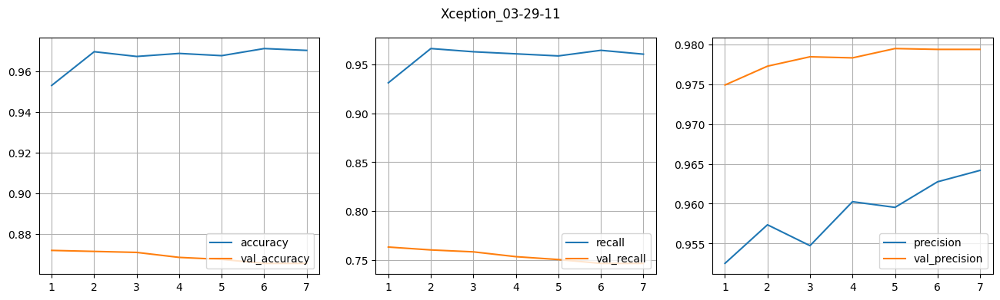

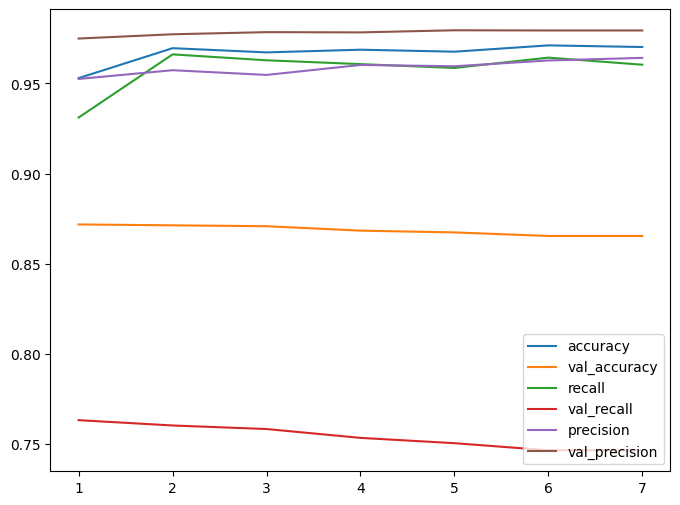

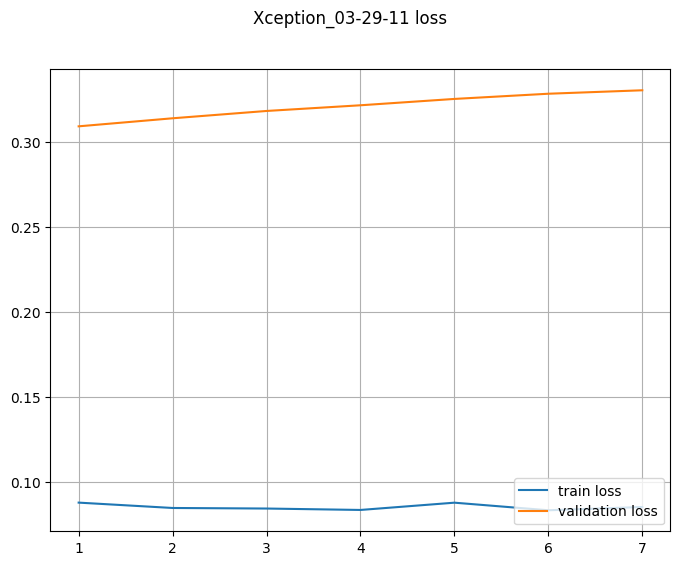

In [ ]:
plot_scores (df_basic, MODEL_NAME, ['accuracy', 'recall', 'precision'])
plot_loss(df_basic, MODEL_NAME)

In [ ]:
# load best model after fine tuning
model_path = f"/content/small-ft-{MODEL_NAME}.keras"
best_ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

best_ft_results = best_ft_model.evaluate(test_ds, verbose=1)

precision = best_ft_results[2]
recall = best_ft_results[3]
fbeta = fbeta_metric(precision, recall)
best_ft_results.append(fbeta)

268/268 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - accuracy: 0.9423 - auc: 0.9564 - fn: 125.1227 - fp: 113.4684 - loss: 0.1621 - prc: 0.8671 - precision: 0.7780 - recall: 0.7670 - tn: 3654.6394 - tp: 426.5019


In [ ]:
for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_ft_results):
  print(metric, ': ', value)
print()

# Зберегти результат оцінки на тествому наборі
df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': best_ft_results})
df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

loss :  0.1553182303905487
accuracy :  0.946704089641571
precision :  0.8027777671813965
recall :  0.7810810804367065
tp :  867.0
fp :  213.0
tn :  7233.0
fn :  243.0
auc :  0.9578269124031067
prc :  0.8758932948112488
f1_beta :  0.8279522921214174



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

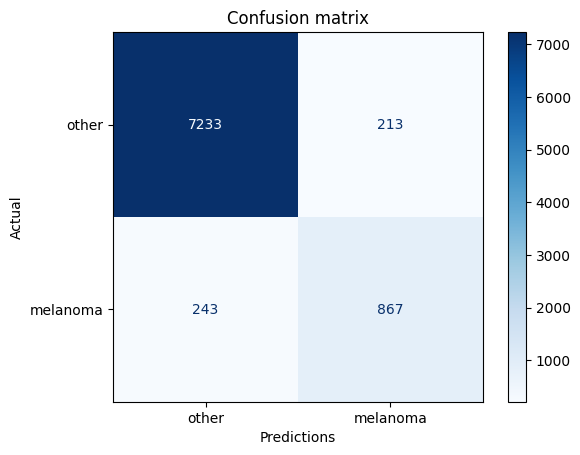

In [ ]:
predictions_array = []
test_labels_array = []
images_array = []
for images, labels in test_ds:
    predictions = best_ft_model.predict(images, verbose=0)
    predictions_array.extend(predictions)
    test_labels_array.extend(labels.numpy())
    images_array.extend(images)
predictions_array = np.array(predictions_array)
test_labels_array = np.array(test_labels_array)
images_array = np.array(images_array)

plot_confusion_matrix(test_labels_array, predictions_array, threshold=0.5)

In [ ]:
print(predictions_array.shape)
print(test_labels_array.shape)

(8556, 1)
(8556,)


In [ ]:
predictions_array = np.squeeze(predictions_array)
print(predictions_array.shape)

(8556,)


In [ ]:
predictions_array[0]

np.float32(0.053631682)

In [ ]:
test_labels_array[0]

np.int32(0)

In [ ]:
threshold = 0.5
predictions_labels = (predictions_array >= threshold).astype(int)

In [ ]:
false_negative_indices = np.where((test_labels_array == 1) & (predictions_labels == 0))[0]
true_positive_indices = np.where((test_labels_array == 1) & (predictions_labels == 1))[0]
false_positive_indices = np.where((test_labels_array == 0) & (predictions_labels == 1))[0]
true_negative_indices = np.where((test_labels_array == 0) & (predictions_labels == 0))[0]
print(len(false_negative_indices))
print(len(true_positive_indices))
print(len(false_positive_indices))
print(len(true_negative_indices))

243
867
213
7233


## Візуалізація передбачень Xception

False Negative:


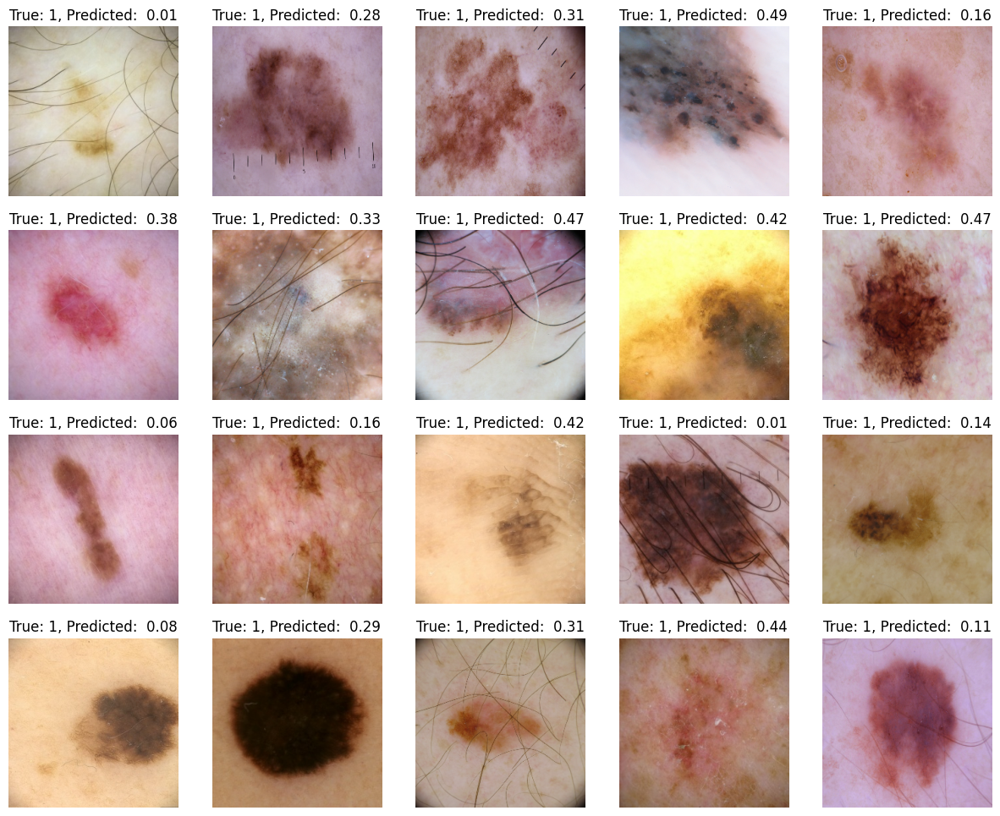

In [ ]:
# Візуалізація FN
print("False Negative:")
plt.figure(figsize=(15, 12))
for i, idx in enumerate(false_negative_indices[:20]):  # перші 20 екземплярів
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(images_array[idx].astype("float32") / 255.0)
  plt.title(f"True: {test_labels_array[idx]}, Predicted: {predictions_array[idx]: .2f}")
  plt.axis("off")
  # plt.show()

True Positive:


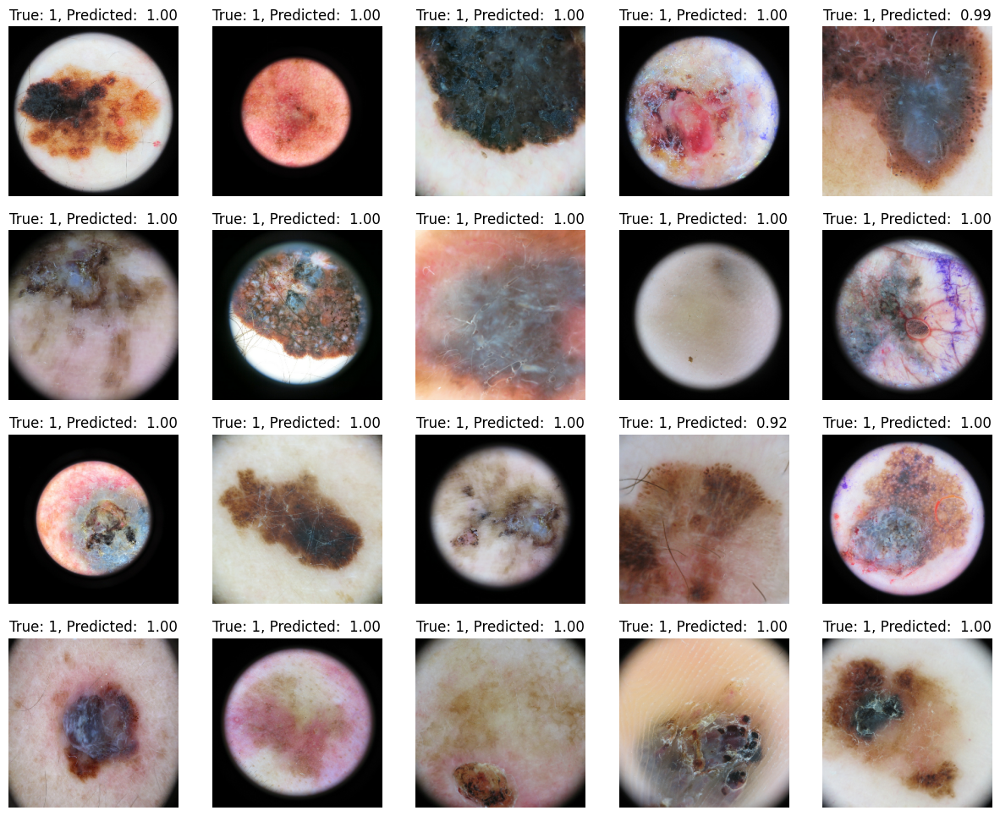

In [ ]:
# Візуалізація TP
print("True Positive:")
plt.figure(figsize=(15, 12))
for i, idx in enumerate(true_positive_indices[:20]):  # перші 20 екземплярів
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(images_array[idx].astype("float32") / 255.0)
  plt.title(f"True: {test_labels_array[idx]}, Predicted: {predictions_array[idx]: .2f}")
  plt.axis("off")
  # plt.show()

False Positive:


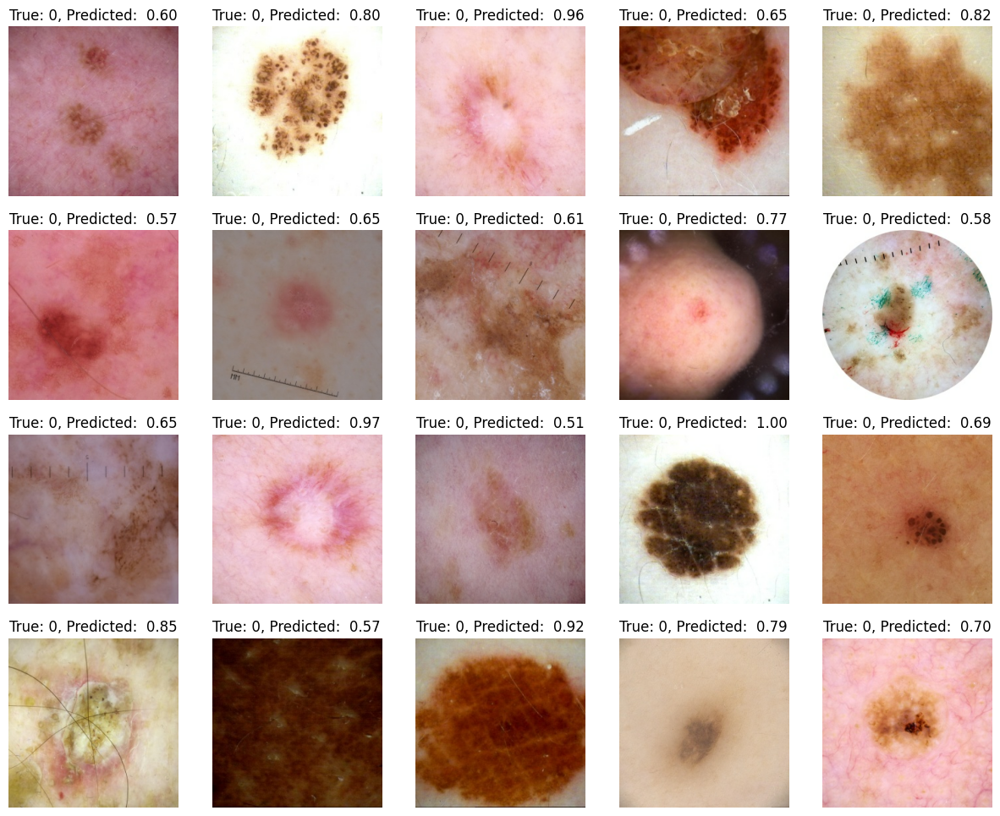

In [ ]:
# Візуалізація FP
print("False Positive:")
plt.figure(figsize=(15, 12))
for i, idx in enumerate(false_positive_indices[:20]):  # перші 20 екземплярів
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(images_array[idx].astype("float32") / 255.0)
  plt.title(f"True: {test_labels_array[idx]}, Predicted: {predictions_array[idx]: .2f}")
  plt.axis("off")
  # plt.show()

True Negative:


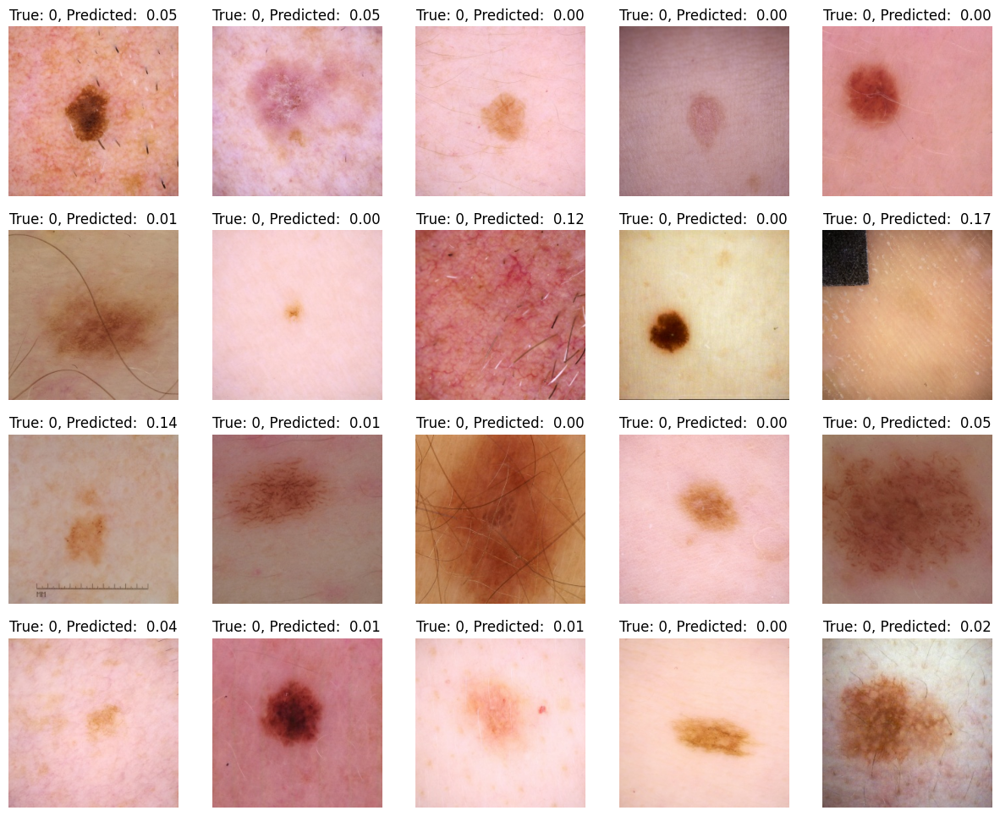

In [ ]:
# Візуалізація TN
print("True Negative:")
plt.figure(figsize=(15, 12))
for i, idx in enumerate(true_negative_indices[:20]):  # перші 20 екземплярів
  ax = plt.subplot(4, 5, i + 1)
  plt.imshow(images_array[idx].astype("float32") / 255.0)
  plt.title(f"True: {test_labels_array[idx]}, Predicted: {predictions_array[idx]: .2f}")
  plt.axis("off")
  # plt.show()

Екземпляри з меланомою в більшості представлені зображеннями у вигляді круга з теними краями. Це може впливати на те, що модель саме такий вигляд сприймає як одну з ознак позитивного класу. Тому на влідаційному наборі може бути така висока точність. Більше 50% вибірки з TP зображень мають чорний фон, у той час як вибірка FN не має таких зображень.

Виконати аугментацію частини зображень негативного класу в тренувальному наборі додаванням темного фону та перевірити вплив чорного фону зображення на класифікацію.

### Донавчання Xception, lr=1e-05

In [ ]:
MODEL_NAME = "Xception_03-29-11"
label =  'ft-'
model_path = "/content/small-tl-Xception_03-29-11.keras"

In [ ]:
# створити логгер
metrics_logger = MetricsLogger(filepath=f"metrics_logs_{label}{MODEL_NAME}.csv")

# змінено LR з 1e-6 на 1e-5
best_tl_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss=keras.losses.BinaryCrossentropy(),
    metrics=METRICS)

callbacks_list = [EarlyStopping(monitor='val_accuracy', patience=6),
                  ModelCheckpoint(f'small-{label}{MODEL_NAME}.keras', monitor='val_loss', save_best_only=True),
                  metrics_logger,
                  # WandbMetricsLogger(),
                  # WandbModelCheckpoint(filepath=f"small-{label}{MODEL_NAME}_wandb.keras", monitor="val_loss")
]

epochs=20

In [ ]:
# Xception fine tuning
history = best_tl_model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=callbacks_list,
  class_weight=class_weights
)


Epoch 1/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 163s 276ms/step - accuracy: 0.9103 - auc: 0.9726 - fn: 239.4297 - fp: 356.0186 - loss: 0.2282 - prc: 0.9649 - precision: 0.8628 - recall: 0.9272 - tn: 4333.8325 - tp: 2828.6819 - val_accuracy: 0.8315 - val_auc: 0.9564 - val_fn: 333.0000 - val_fp: 10.0000 - val_loss: 0.3935 - val_prc: 0.9631 - val_precision: 0.9856 - val_recall: 0.6729 - val_tn: 1008.0000 - val_tp: 685.0000
Epoch 2/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 112s 225ms/step - accuracy: 0.9564 - auc: 0.9901 - fn: 213.9607 - fp: 116.1508 - loss: 0.1213 - prc: 0.9865 - precision: 0.9606 - recall: 0.9280 - tn: 4569.7148 - tp: 2859.0662 - val_accuracy: 0.8610 - val_auc: 0.9664 - val_fn: 275.0000 - val_fp: 8.0000 - val_loss: 0.3109 - val_prc: 0.9719 - val_precision: 0.9893 - val_recall: 0.7299 - val_tn: 1010.0000 - val_tp: 743.0000
Epoch 3/20
483/483 ━━━━━━━━━━━━━━━━━━━━ 139s 224ms/step - accuracy: 0.9665 - auc: 0.9936 - fn: 159.7541 - fp: 89.6550 - loss: 0.0939 - prc: 0.9916 - precision: 0.9675 - 

In [ ]:
# from google.colab import files

df_basic = pd.DataFrame(history.history)
df_basic.to_csv(f"metrics_{label}{MODEL_NAME}.csv", index=False)

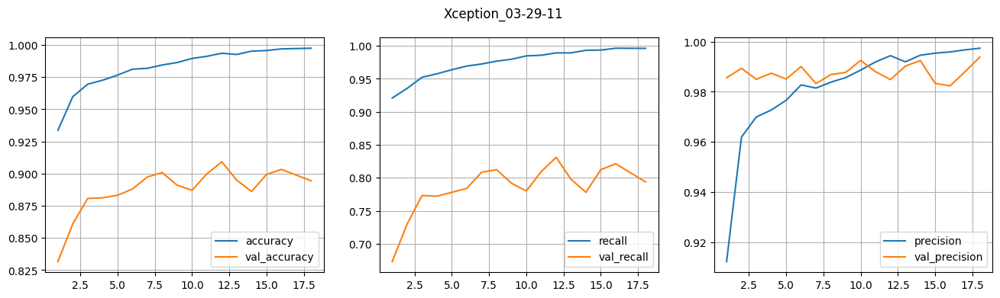

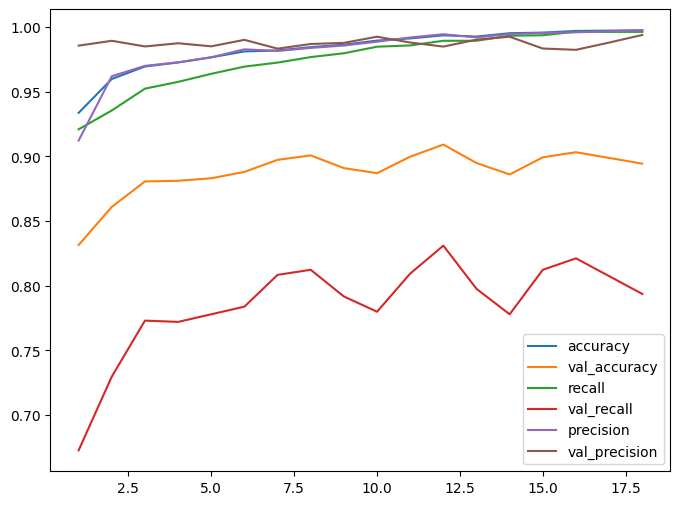

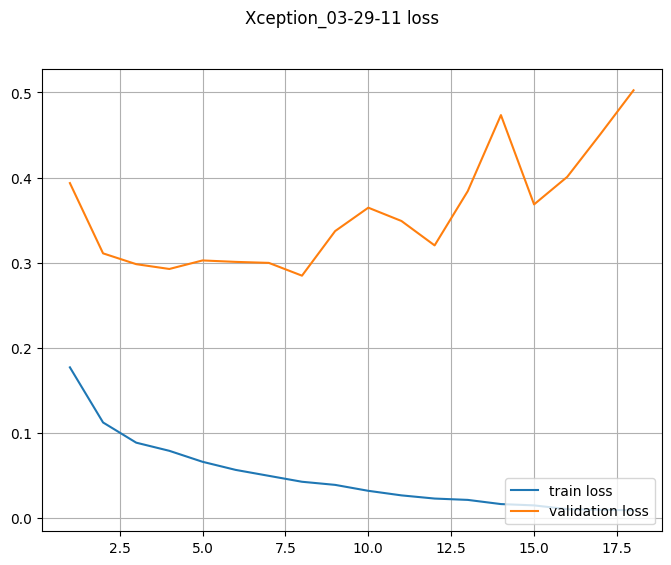

In [ ]:
plot_scores (df_basic, MODEL_NAME, ['accuracy', 'recall', 'precision'])
plot_loss(df_basic, MODEL_NAME)

In [ ]:
# load best model after fine tuning
model_path = f"/content/small-ft-{MODEL_NAME}.keras"
best_ft_model = keras.models.load_model(model_path, custom_objects={"preprocess_input": preprocess_input})

best_ft_results = best_ft_model.evaluate(test_ds, verbose=1)

precision = best_ft_results[2]
recall = best_ft_results[3]
fbeta = fbeta_metric(precision, recall)
best_ft_results.append(fbeta)


for metric, value in zip(["loss"] + [m.name for m in METRICS] + ["f1_beta"], best_ft_results):
  print(metric, ': ', value)
print()

# Зберегти результат оцінки на тествому наборі
df_eval = pd.DataFrame({'Metric': ["loss"] + [m.name for m in METRICS] + ["f1_beta"], 'Value': best_ft_results})
df_eval.to_csv(f'evaluate_results_{label}{MODEL_NAME}.csv', index=False)
files.download(f'/content/evaluate_results_{label}{MODEL_NAME}.csv')

loss :  0.12912298738956451
accuracy :  0.958158016204834
precision :  0.8494423627853394
recall :  0.823423445224762
tp :  914.0
fp :  162.0
tn :  7284.0
fn :  196.0
auc :  0.9641915559768677
prc :  0.9043720364570618
f1_beta :  0.8284989267923524



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>